# **Phần 1: Xử lý dữ liệu hình ảnh**

## **1. Setup**
### **1.1 Thư viện và một số thiết lập khác**

In [55]:
import os
import cv2
import numpy as np
from matplotlib import pyplot as plt

import json

In [56]:
# import kagglehub

# def download_dataset():
    
    
#     # Download latest version
#     path = kagglehub.dataset_download("vipoooool/new-plant-diseases-dataset")
    
#     print("Path to dataset files:", path)

# # download_dataset()
# '''
# plant_names = ["apple", "blueberry", "cherry", "corn", "grape", "orange", "peach", "pepper", 
#                "potato", "raspberry", "soybean", "squash", "strawberry", "tomato"]
# '''

In [57]:
def get_plant_info(dataset_path):
    info = {}
    for dirname in os.listdir(dataset_path):
        plant_name, disease = dirname.split("___")
        plant_dataset = (disease, os.path.join(dataset_path, dirname))
        if plant_name not in info:
            info[plant_name] = [plant_dataset]
        else:
            info[plant_name].append(plant_dataset)

    return info

In [58]:
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
path = os.path.join(parent_dir, 'data', 'New Plant Diseases Dataset(Augmented)', 'New Plant Diseases Dataset(Augmented)','train')

info = get_plant_info(path)
print(json.dumps(info, indent=4))

{
    "Strawberry": [
        [
            "healthy",
            "/Users/thomas200905/Documents/Thomas/HCMUS/Third Year/Semester 8/Data Mining/labs/lab1/data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Strawberry___healthy"
        ],
        [
            "Leaf_scorch",
            "/Users/thomas200905/Documents/Thomas/HCMUS/Third Year/Semester 8/Data Mining/labs/lab1/data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Strawberry___Leaf_scorch"
        ]
    ],
    "Grape": [
        [
            "Black_rot",
            "/Users/thomas200905/Documents/Thomas/HCMUS/Third Year/Semester 8/Data Mining/labs/lab1/data/New Plant Diseases Dataset(Augmented)/New Plant Diseases Dataset(Augmented)/train/Grape___Black_rot"
        ],
        [
            "Leaf_blight_(Isariopsis_Leaf_Spot)",
            "/Users/thomas200905/Documents/Thomas/HCMUS/Third Year/Semester 8/Data Mining/labs/lab1/data/New Plant Diseases Dataset

### **1.1 Đọc và thay đổi kích thước hình ảnh**

In [59]:
def load_images(dataset_path):
    images = []
    if not os.path.exists(dataset_path):
        print(f"Error: Path not found: {dataset_path}")
        
        return []
        
    for filename in os.listdir(dataset_path):
        if filename.lower().endswith(('.jpg', '.png', '.jpeg')):
            img_path = os.path.join(dataset_path, filename)
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                images.append(img)

    return images

def resize_images(images, size=(224, 224)):
    return [cv2.resize(image, size) for image in images]

### **1.2 Hệ màu trắng đen**

In [60]:
def grayscale(image):
    red = image[:, :, 0]
    green = image[:, :, 1]
    blue = image[:, :, 2] 

    grayscale = (0.299 * red + 0.587 * green + 0.114 * blue).astype(np.uint8)
    
    return grayscale

def visualize_gray(image, saved_path=""):
    plt.subplot(1, 2, 1)
    plt.imshow(image)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(grayscale(image), cmap="gray")
    plt.axis('off')
    
    if saved_path != "":
        plt.savefig(saved_path)
    plt.show()

### **1.3 Chuẩn hóa**

In [61]:
def normalize(image):
    image = image.astype('float32')
    mean = np.mean(image, axis=(0, 1), keepdims=True)
    std = np.std(image, axis=(0, 1), keepdims=True)
    scale = image / 255
    standardized = (image - mean) / (std + 1e-8)

    return scale, standardized

### **1.4 Edge Detection**

#### **1.4.1 Sobel**

In [62]:
def sobel(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY) 
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=3)
    gradient_magnitude = cv2.magnitude(sobelx, sobely)
    gradient_magnitude = cv2.convertScaleAbs(gradient_magnitude)

    return gradient_magnitude 

#### **1.4.2 Canny**

In [ ]:
def canny(image):
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 1.4)
    
    return cv2.Canny(blur, 100, 200)

#### **1.4.3 Prewitt**

In [64]:
def prewitt(image):
    kernelx = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]])
    kernely = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])
    
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray = image
        
    prewittx = cv2.filter2D(gray, cv2.CV_64F, kernelx)
    prewitty = cv2.filter2D(gray, cv2.CV_64F, kernely)

    gradient_magnitude = np.sqrt(prewittx**2 + prewitty**2)
    gradient_magnitude = cv2.normalize(gradient_magnitude, None, 0, 255, cv2.NORM_MINMAX, dtype=cv2.CV_8U)

    return gradient_magnitude

#### **1.4.4 Hiển thị kết quả edge detection**

In [65]:
def visualize_edges(edge_images, saved_path=""):
    plt.figure(figsize=(10, 10))
    for idx, edge_img in enumerate(edge_images):
        plt.subplot(3, 3, idx + 1)
        if len(edge_img.shape) == 3:
            plt.imshow(edge_img) 
        else:
            plt.imshow(edge_img, cmap='gray')
        plt.axis('off')

    if saved_path != "":
        plt.savefig(saved_path)
    plt.show()

## **2. Chương trình chính**

#### 5.1 Ảnh test cho hệ màu xám

In [66]:
testPath = os.path.join(parent_dir, 'data', 'test', 'test')

test_images = load_images(testPath)
test_images = resize_images(test_images, (224, 224))

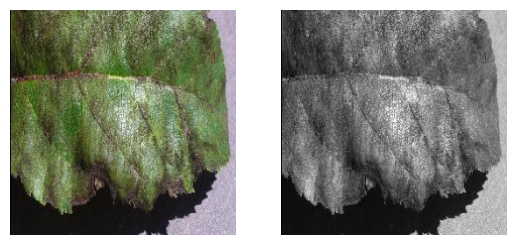

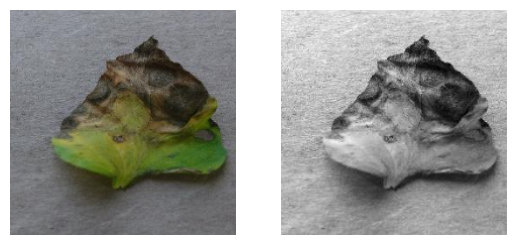

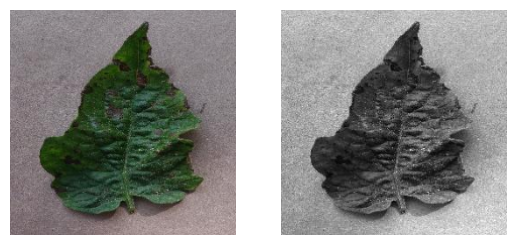

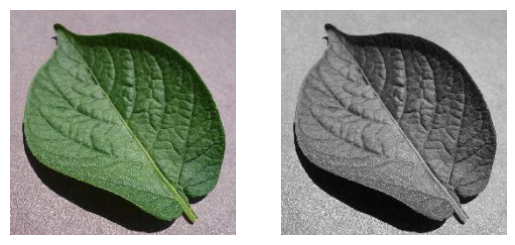

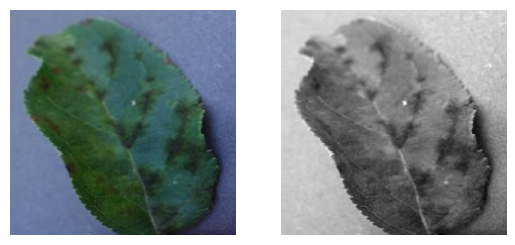

...

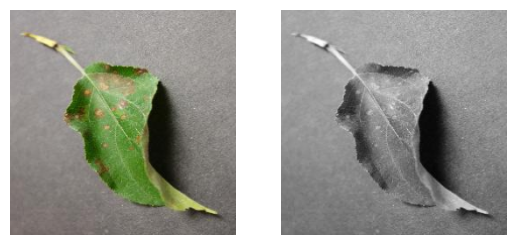

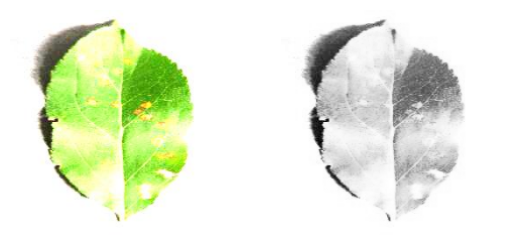

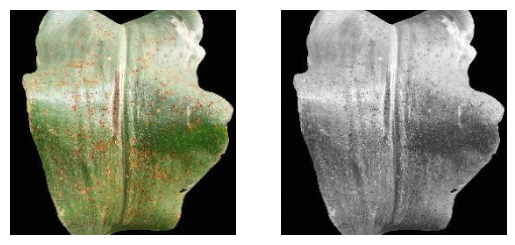

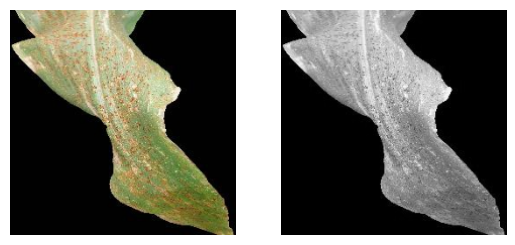

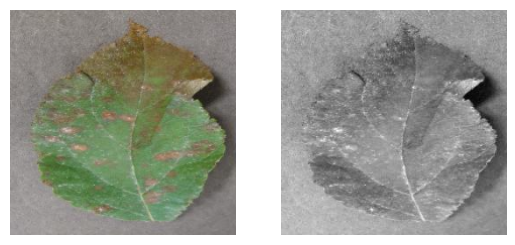

In [67]:
for image in test_images:
    visualize_gray(image)

#### 5.2 Chuẩn hóa và hiển thị phân phối giá trị của pixel

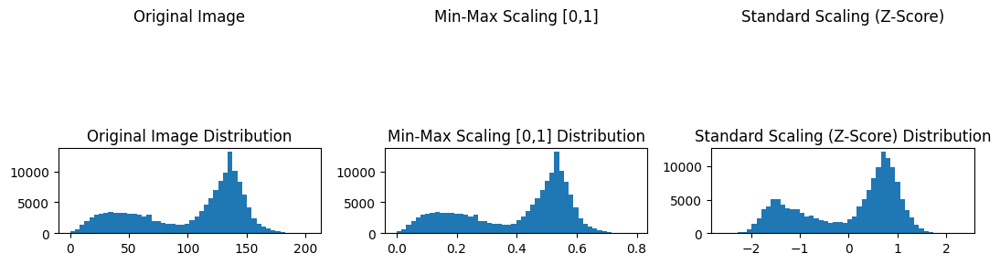

In [68]:
image = test_images[2]
zero_one_scaling, standardized = normalize(image)
normalization_methods = {
    'Original Image': image,
    'Min-Max Scaling [0,1]': zero_one_scaling,
    'Standard Scaling (Z-Score)': standardized,
}

plt.figure(figsize=(18, 3))

for i, (name, normalized_img) in enumerate(normalization_methods.items(), 1):
    plt.subplot(2, 5, i)
    # plt.imshow(normalized_img)
    plt.title(name)
    plt.axis('off')

    plt.subplot(2, 5, i+5)
    plt.hist(normalized_img.ravel(), bins=50)
    plt.title(f'{name} Distribution')

plt.tight_layout()
plt.show()

#### 5.3 Áp dụng các thuật toán tìm edge detection

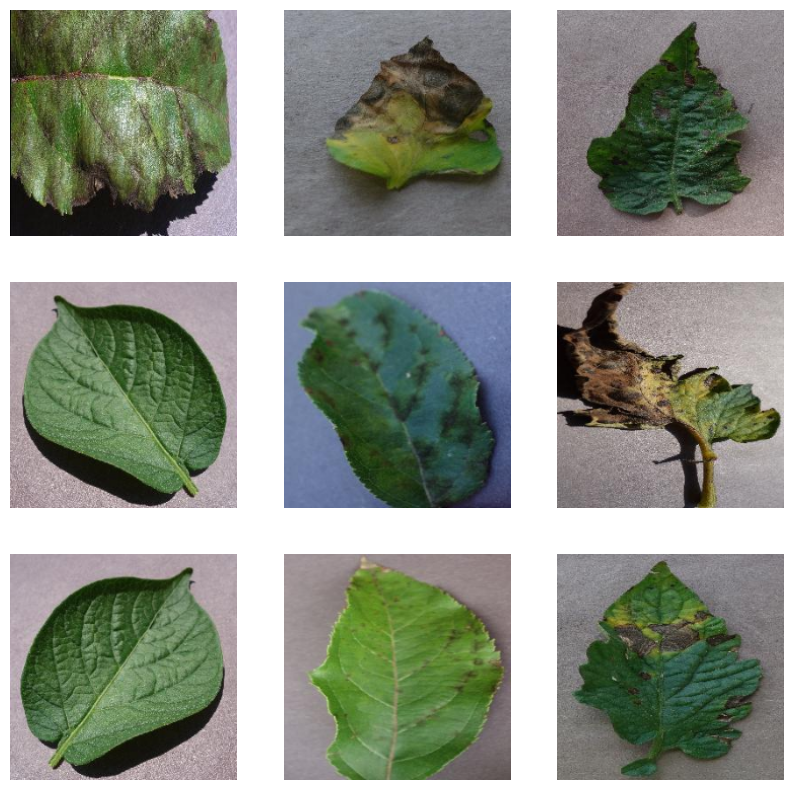

In [69]:
visualize_edges(test_images[:9], "original.png")

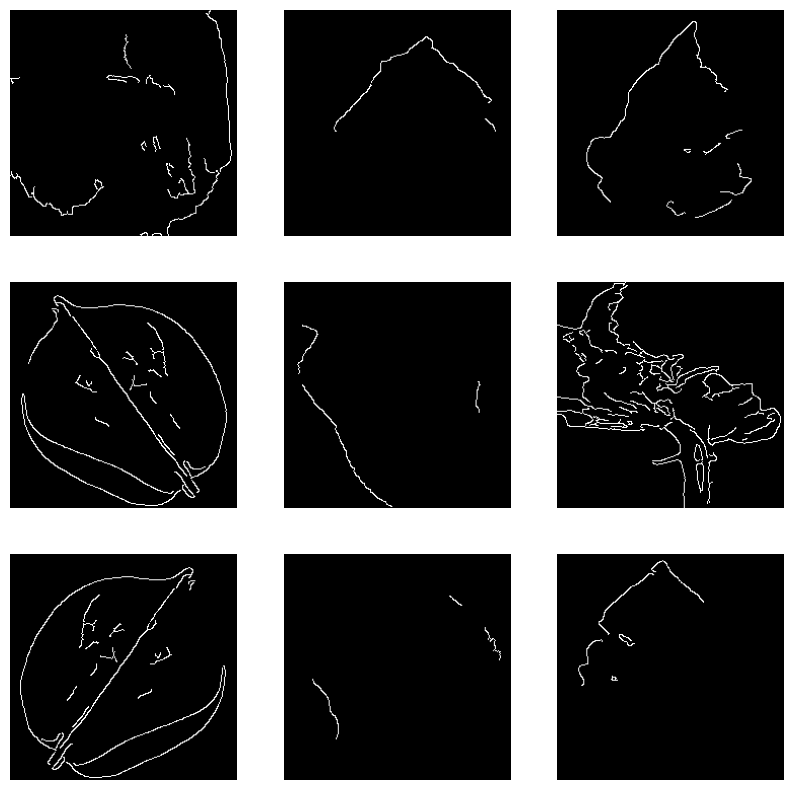

In [70]:
edge_images = [canny(image) for image in test_images[:9]]

visualize_edges(edge_images, "canny.png")

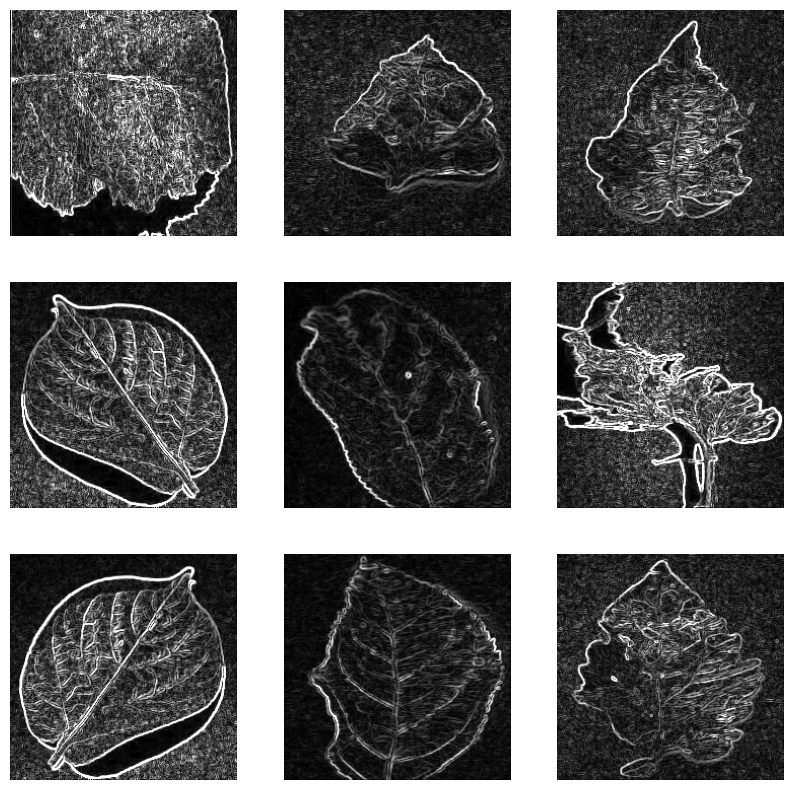

In [71]:
edge_images = [sobel(image) for image in test_images[:9]]

visualize_edges(edge_images, "sobel.png")

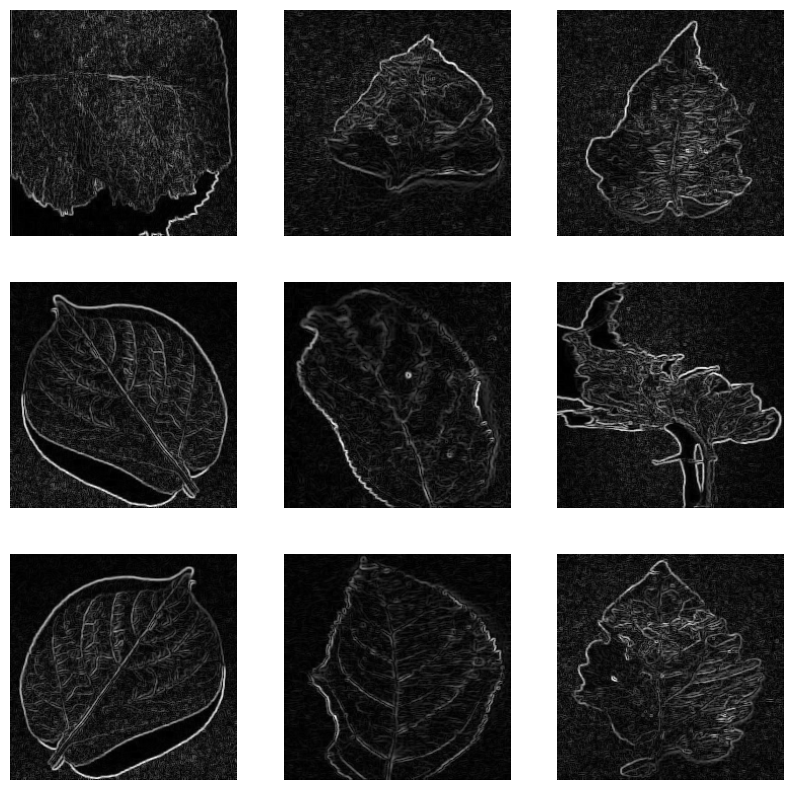

In [72]:
edge_images = [prewitt(image) for image in test_images[:9]]

visualize_edges(edge_images, "prewitt.png")

## **3. Phân tích**
### **3.1 Chọn kích thước ảnh**

In [ ]:
def analyze_original_sizes(dataset_path, num_samples=500):
    widths = []
    heights = []
    count = 0
    
    print(f"Đang quét kích thước của {num_samples} ảnh mẫu ngẫu nhiên...")
    
    # Duyệt qua các thư mục con để lấy ảnh
    for root, dirs, files in os.walk(dataset_path):
        for file in files:
            if file.lower().endswith(('.jpg', '.png', '.jpeg')):
                img_path = os.path.join(root, file)
                # Đọc ảnh (chỉ cần shape, không cần convert màu để cho nhanh)
                img = cv2.imread(img_path)
                if img is not None:
                    h, w, _ = img.shape
                    widths.append(w)
                    heights.append(h)
                    count += 1
                
                if count >= num_samples:
                    break
        if count >= num_samples:
            break
            
    # Chuyển sang numpy array để tính toán
    widths = np.array(widths)
    heights = np.array(heights)
    
    # 1. Thống kê cơ bản
    print(f"\n--- KẾT QUẢ PHÂN TÍCH TRÊN {count} ẢNH ---")
    print(f"Chiều rộng (Width): Min={widths.min()}, Max={widths.max()}, Trung bình={widths.mean():.1f}")
    print(f"Chiều cao (Height): Min={heights.min()}, Max={heights.max()}, Trung bình={heights.mean():.1f}")
    
    # 2. Vẽ biểu đồ phân bố (Scatter Plot)
    plt.figure(figsize=(10, 5))
    
    # Biểu đồ tán xạ
    plt.subplot(1, 2, 1)
    plt.scatter(widths, heights, alpha=0.5, c='green', edgecolors='none')
    plt.title('Phân bố Kích thước Ảnh (Width vs Height)')
    plt.xlabel('Chiều rộng (Pixels)')
    plt.ylabel('Chiều cao (Pixels)')
    plt.grid(True, linestyle='--', alpha=0.5)
    
    # Nếu tất cả ảnh bằng nhau, điểm trên biểu đồ sẽ chồng lên nhau thành 1 chấm
    # Ta hiển thị thêm biểu đồ đếm số lượng các kích thước duy nhất
    unique_sizes, counts = np.unique(list(zip(widths, heights)), axis=0, return_counts=True)
    
    plt.subplot(1, 2, 2)
    size_labels = [f"{s[0]}x{s[1]}" for s in unique_sizes]
    plt.bar(size_labels, counts, color='orange')
    plt.title('Số lượng ảnh theo kích thước')
    plt.xlabel('Kích thước')
    plt.ylabel('Số lượng')
    plt.xticks(rotation=45)
    
    plt.tight_layout()
    plt.show()


Đang quét kích thước của 1000 ảnh mẫu ngẫu nhiên...

--- KẾT QUẢ PHÂN TÍCH TRÊN 1000 ẢNH ---
Chiều rộng (Width): Min=256, Max=256, Trung bình=256.0
Chiều cao (Height): Min=256, Max=256, Trung bình=256.0


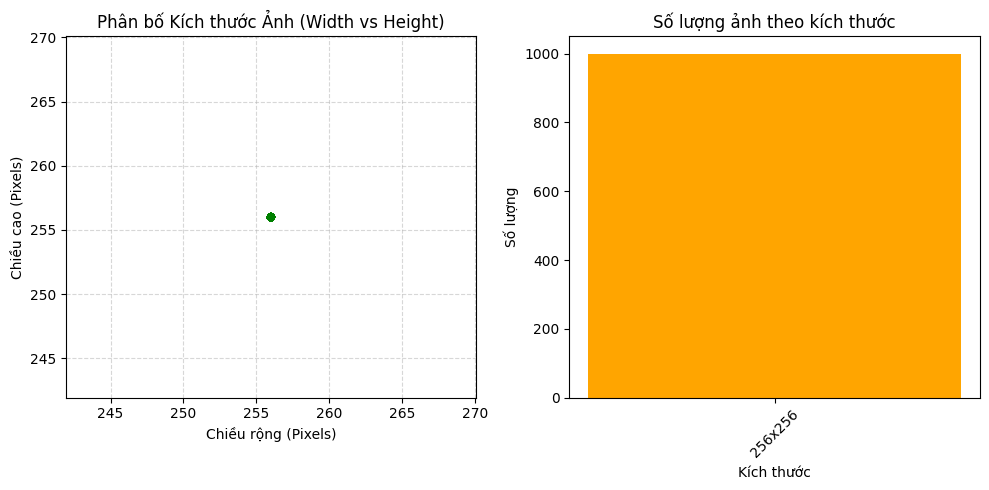

In [74]:
# Chạy phân tích trên tập train
analyze_original_sizes(path, num_samples=1000)

--- BẮT ĐẦU PHÂN TÍCH HIỆU NĂNG (2000 lần lặp/kích thước) ---
Kích thước 32x32: 0.0592 ms
Kích thước 64x64: 0.0645 ms
Kích thước 128x128: 0.0763 ms
Kích thước 224x224: 0.1219 ms
Kích thước 256x256: 0.1282 ms
Kích thước 512x512: 0.4101 ms


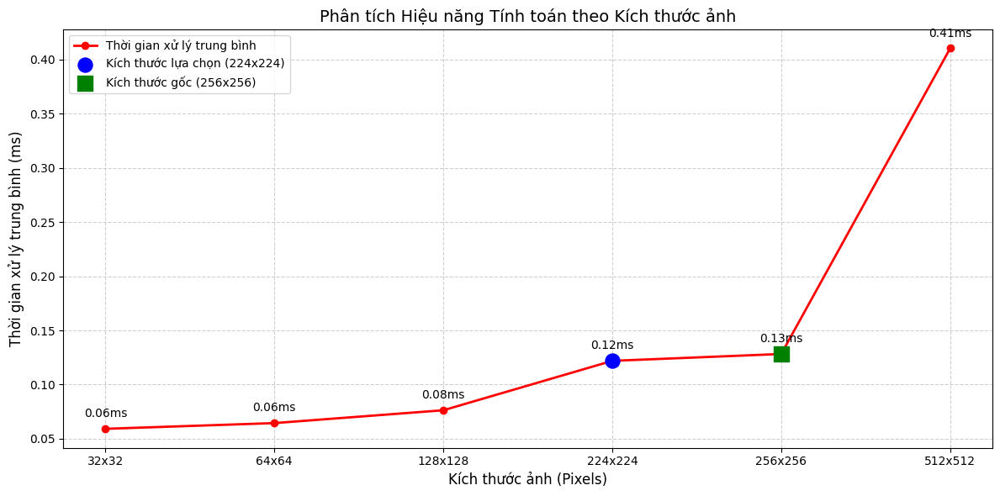

In [189]:
import time

# %% [markdown]
# #### 6.1 Phân tích đánh đổi: Kích thước ảnh vs Hiệu năng (Requirement A)
# Chúng tôi thực hiện đo thời gian xử lý một chuỗi thao tác (Xám hóa -> Làm mờ -> Tách biên Canny) 
# trên các kích thước khác nhau. Chúng tôi thực hiện 100 lần lặp mỗi kích thước sau một giai đoạn 
# "làm nóng" (warm-up) để đảm bảo kết quả đo lường khách quan và ổn định nhất.

# %%
def analyze_size_efficiency_tradeoff(image):
    # Các kích thước thử nghiệm, bao gồm kích thước gốc (256x256) và kích thước lựa chọn (224x224)
    dimensions = [(32, 32), (64, 64), (128, 128), (224, 224), (256, 256), (512, 512)]
    avg_times_ms = []
    labels = [f"{d[0]}x{d[1]}" for d in dimensions]
    
    # Số lần lặp để lấy trung bình
    iterations = 2000
    warmup_runs = 10
    
    print(f"--- BẮT ĐẦU PHÂN TÍCH HIỆU NĂNG ({iterations} lần lặp/kích thước) ---")
    
    for size in dimensions:
        resized_img = cv2.resize(image, size)
        
        # 1. Warm-up phase (Làm nóng CPU)
        for _ in range(warmup_runs):
            gray = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY)
            blur = cv2.GaussianBlur(gray, (5, 5), 0)
            _ = cv2.Canny(blur, 100, 200)
            
        # 2. Measurement phase (Đo lường thực tế)
        start_time = time.perf_counter()
        for _ in range(iterations):
            gray = cv2.cvtColor(resized_img, cv2.COLOR_RGB2GRAY)
            blur = cv2.GaussianBlur(gray, (5, 5), 0)
            _ = cv2.Canny(blur, 100, 200)
        end_time = time.perf_counter()
        
        avg_time_ms = ((end_time - start_time) / iterations) * 1000
        avg_times_ms.append(avg_time_ms)
        print(f"Kích thước {size[0]}x{size[1]}: {avg_time_ms:.4f} ms")

    # Vẽ biểu đồ
    plt.figure(figsize=(12, 6))
    plt.plot(labels, avg_times_ms, marker='o', color='red', linewidth=2, label='Thời gian xử lý trung bình')
    
    # Đánh dấu các điểm quan trọng
    # Điểm 224x224 (Lựa chọn của đồ án)
    plt.scatter(labels[3], avg_times_ms[3], color='blue', s=150, zorder=5, label='Kích thước lựa chọn (224x224)')
    # Điểm 256x256 (Kích thước gốc)
    plt.scatter(labels[4], avg_times_ms[4], color='green', s=150, zorder=5, marker='s', label='Kích thước gốc (256x256)')
    
    plt.title('Phân tích Hiệu năng Tính toán theo Kích thước ảnh', fontsize=14)
    plt.xlabel('Kích thước ảnh (Pixels)', fontsize=12)
    plt.ylabel('Thời gian xử lý trung bình (ms)', fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.legend()
    
    # Hiển thị giá trị cụ thể trên biểu đồ
    for i, txt in enumerate(avg_times_ms):
        plt.annotate(f"{txt:.2f}ms", (labels[i], avg_times_ms[i]), textcoords="offset points", xytext=(0,10), ha='center')

    plt.tight_layout()
    plt.show()

# Chạy phân tích
if len(test_images) > 0:
    analyze_size_efficiency_tradeoff(test_images[0])

In [180]:
# %% [markdown]
# #### 6.2 Phân tích trực quan chất lượng hình ảnh theo kích thước (Requirement A)
# Chúng tôi thực hiện hiển thị các mẫu lá ở các độ phân giải khác nhau để đánh giá khả năng 
# quan sát các đặc điểm bệnh lý (vết đốm, gân lá) so với chi phí tính toán.

# %%
def visualize_size_quality_comparison(images, num_samples=5, dimensions = [32, 64, 128, 224, 256, 512]):
    
    # Thiết lập khung hình (Rows = số ảnh mẫu, Cols = số kích thước)
    fig, axes = plt.subplots(num_samples, len(dimensions), figsize=(20, 15))
    plt.subplots_adjust(wspace=0.1, hspace=0.3)
    
    # Tiêu đề chính cho toàn bộ biểu đồ
    fig.suptitle('So sánh Chất lượng Hình ảnh theo các Kích thước khác nhau', fontsize=20, y=0.95)

    for i in range(num_samples):
        img = images[i]
        
        for j, size in enumerate(dimensions):
            # Resize ảnh
            resized = cv2.resize(img, (size, size))
            
            # Hiển thị ảnh
            axes[i, j].imshow(resized)
            
            # Chỉ đặt tiêu đề cho hàng đầu tiên
            if i == 0:
                axes[i, j].set_title(f"Kích thước\n{size}x{size}", fontsize=14, fontweight='bold')
            
            # Gắn nhãn hàng (Ví dụ: Ảnh mẫu 1, 2...)
            if j == 0:
                axes[i, j].set_ylabel(f"Mẫu {i+1}", fontsize=14, fontweight='bold')
                
            # Tắt trục tọa độ
            axes[i, j].set_xticks([])
            axes[i, j].set_yticks([])

    plt.tight_layout(rect=[0, 0.03, 1, 0.93])
    plt.show()

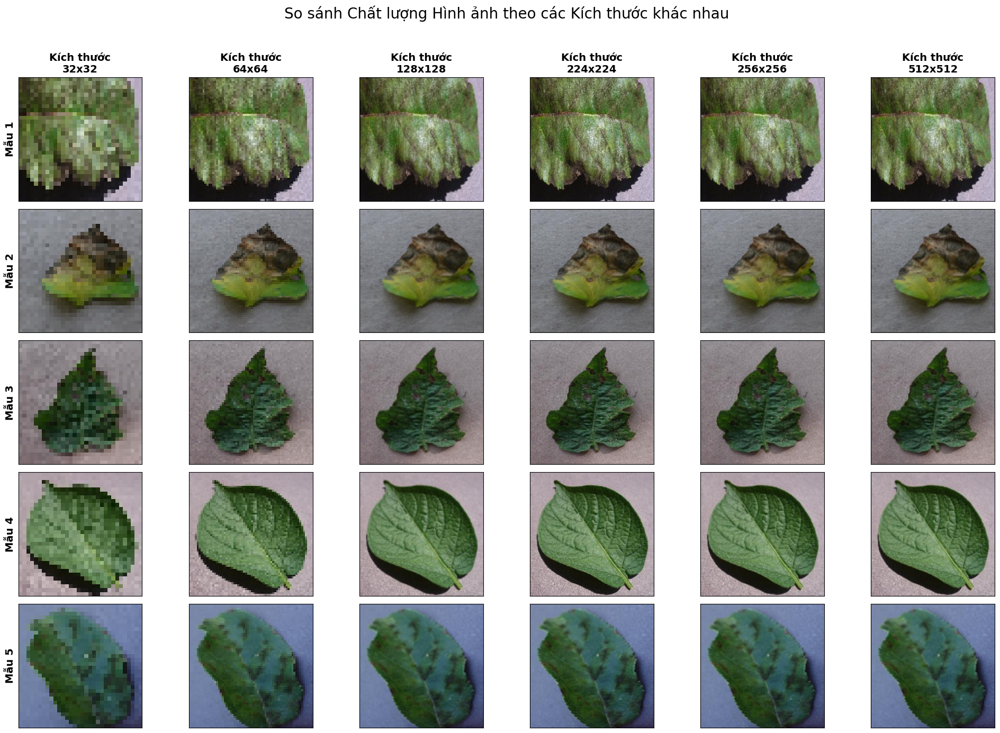

In [181]:
# Thực hiện hiển thị 5 mẫu ảnh từ tập test
if len(test_images) >= 5:
    visualize_size_quality_comparison(test_images, num_samples=5)
else:
    print("Không đủ ảnh trong tập test để thực hiện so sánh.")

Should choose 128x128, we will have a 75% reduction in pixels and a significantly lower processing time. The image quality doesnt suffer that much as well

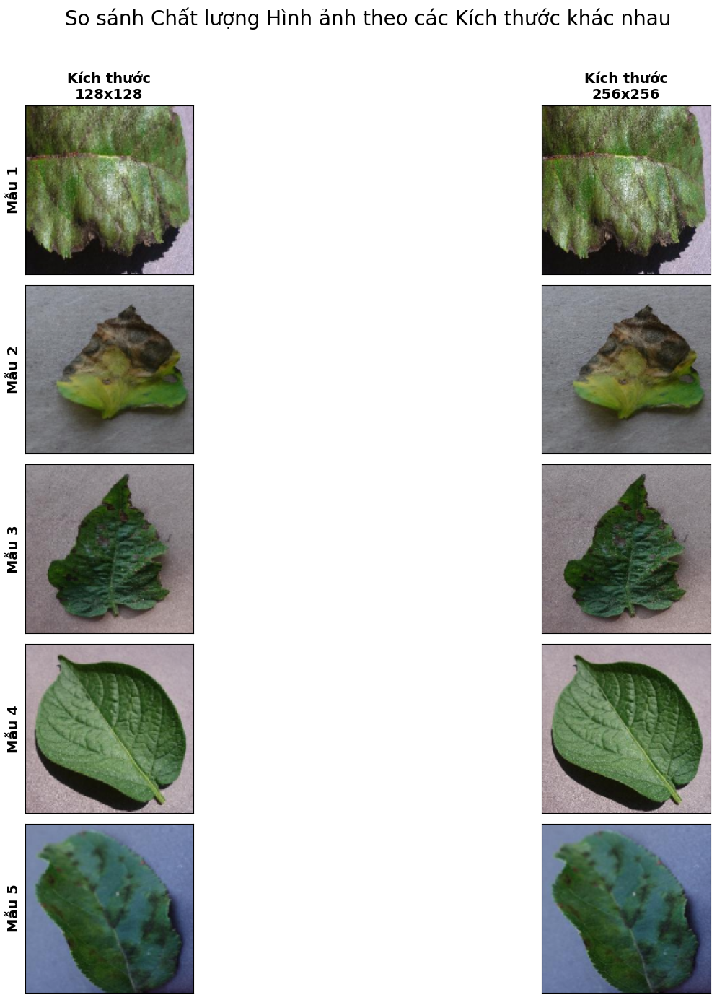

In [177]:
visualize_size_quality_comparison(test_images, num_samples=5, dimensions=[128, 256])

### **3.2 Ảnh xám**

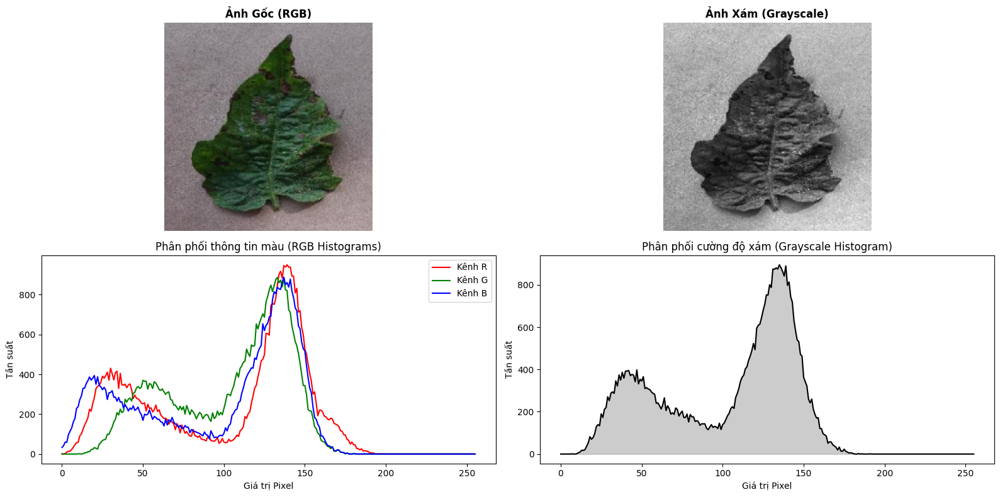

In [190]:
def analyze_grayscale_retention(image):
    gray_img = grayscale(image)
    
    # Thiết lập khung hình
    plt.figure(figsize=(16, 8))
    
    # 1. Hiển thị Ảnh Gốc và Ảnh Xám
    plt.subplot(2, 2, 1)
    plt.imshow(image)
    plt.title('Ảnh Gốc (RGB)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    plt.subplot(2, 2, 2)
    plt.imshow(gray_img, cmap='gray')
    plt.title('Ảnh Xám (Grayscale)', fontsize=12, fontweight='bold')
    plt.axis('off')
    
    # 2. Histogram Màu (RGB) - Cho thấy sự đa dạng thông tin màu
    plt.subplot(2, 2, 3)
    colors = ('r', 'g', 'b')
    for i, col in enumerate(colors):
        hist = cv2.calcHist([image], [i], None, [256], [0, 256])
        plt.plot(hist, color=col, label=f'Kênh {col.upper()}')
    plt.title('Phân phối thông tin màu (RGB Histograms)')
    plt.xlabel('Giá trị Pixel')
    plt.ylabel('Tần suất')
    plt.legend()
    
    # 3. Histogram Xám - Cho thấy sự gộp thông tin
    plt.subplot(2, 2, 4)
    hist_gray = cv2.calcHist([gray_img], [0], None, [256], [0, 256])
    plt.plot(hist_gray, color='black')
    plt.fill_between(range(256), hist_gray.flatten(), color='gray', alpha=0.4)
    plt.title('Phân phối cường độ xám (Grayscale Histogram)')
    plt.xlabel('Giá trị Pixel')
    plt.ylabel('Tần suất')
    
    plt.tight_layout()
    plt.show()

# Thực hiện phân tích trên một mẫu lá có bệnh
analyze_grayscale_retention(test_images[2])

### **3.3 Chuẩn hoá ảnh**

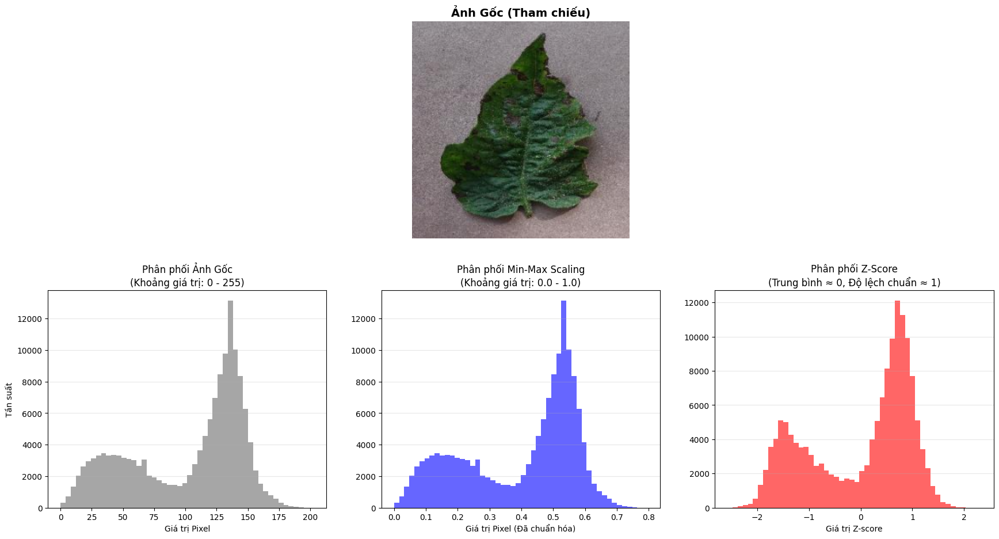

In [184]:
# %% [markdown]
# #### 5.2 Chuẩn hóa và phân tích phân phối giá trị pixel (Requirement C)
# Chúng tôi thực hiện so sánh phân phối dữ liệu giữa ảnh gốc, phương pháp Min-Max Scaling và 
# chuẩn hóa Z-Score. Mục tiêu là quan sát sự thay đổi về phạm vi giá trị (X-axis) 
# trong khi vẫn giữ nguyên cấu trúc thông tin (hình dáng phân phối).

# %%
image = test_images[2]
zero_one_scaling, standardized = normalize(image)

# Cấu hình khung hình
plt.figure(figsize=(18, 10))

# 1. Hiển thị Ảnh Gốc ở chính giữa phía trên để tham chiếu
plt.subplot(2, 3, 2)
plt.imshow(image)
plt.title('Ảnh Gốc (Tham chiếu)', fontsize=14, fontweight='bold')
plt.axis('off')

# 2. Histogram Ảnh Gốc (0-255)
plt.subplot(2, 3, 4)
plt.hist(image.ravel(), bins=50, color='gray', alpha=0.7)
plt.title('Phân phối Ảnh Gốc\n(Khoảng giá trị: 0 - 255)', fontsize=12)
plt.xlabel('Giá trị Pixel')
plt.ylabel('Tần suất')
plt.grid(axis='y', alpha=0.3)

# 3. Histogram Min-Max Scaling [0,1]
plt.subplot(2, 3, 5)
plt.hist(zero_one_scaling.ravel(), bins=50, color='blue', alpha=0.6)
plt.title('Phân phối Min-Max Scaling\n(Khoảng giá trị: 0.0 - 1.0)', fontsize=12)
plt.xlabel('Giá trị Pixel (Đã chuẩn hóa)')
plt.grid(axis='y', alpha=0.3)

# 4. Histogram Z-Score (Standardization)
plt.subplot(2, 3, 6)
plt.hist(standardized.ravel(), bins=50, color='red', alpha=0.6)
plt.title('Phân phối Z-Score\n(Trung bình ≈ 0, Độ lệch chuẩn ≈ 1)', fontsize=12)
plt.xlabel('Giá trị Z-score')
plt.grid(axis='y', alpha=0.3)

plt.tight_layout(pad=3.0)
plt.show()

### **3.4 Edge detection**

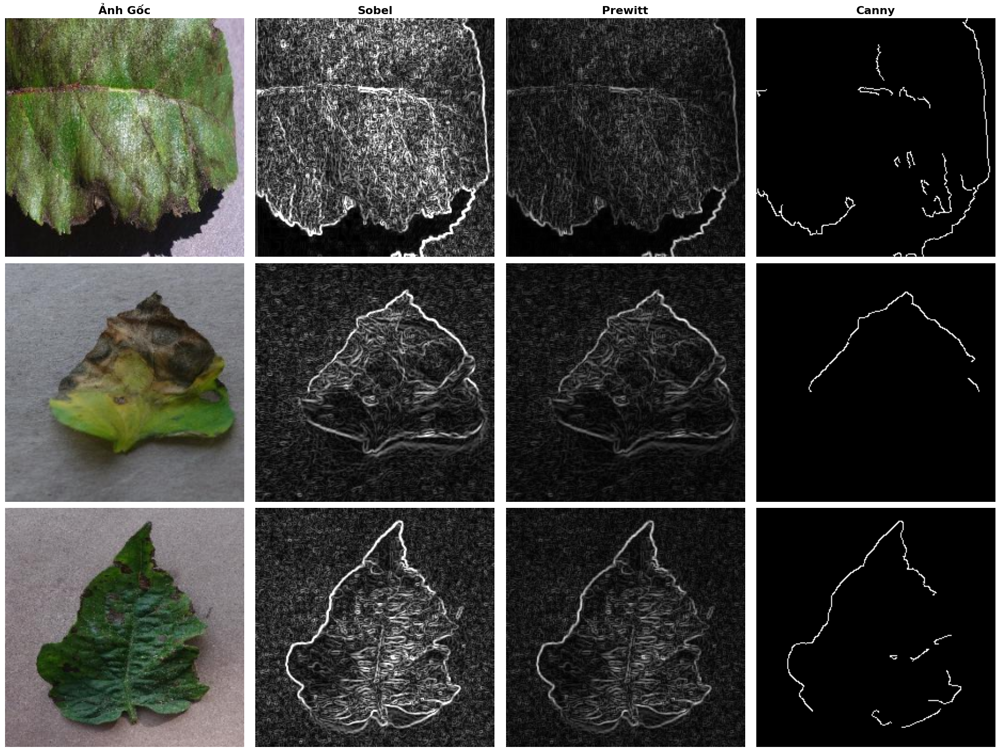

In [192]:
# %% [markdown]
# #### 4.5 So sánh các kỹ thuật tách biên trên nhiều mẫu (Requirement D)
# Chúng tôi thực hiện trích xuất biên trên 3 mẫu lá khác nhau để đánh giá tính ổn định 
# và hiệu quả của các thuật toán Sobel, Prewitt và Canny trong việc xác định cấu trúc vết bệnh.

# %%
def compare_multiple_edge_detectors(images, num_samples=3):
    # Khởi tạo khung hình (Rows = số ảnh mẫu, Cols = Gốc + 3 Thuật toán)
    fig, axes = plt.subplots(num_samples, 4, figsize=(20, 5 * num_samples))
    
    titles = ['Ảnh Gốc', 'Sobel', 'Prewitt', 'Canny']
    
    for i in range(num_samples):
        img = images[i]
        
        # Thực hiện các phép toán tách biên
        results = [
            img,
            sobel(img),
            prewitt(img),
            canny(img)
        ]
        
        for j, result in enumerate(results):
            # Hiển thị ảnh
            if j == 0:
                axes[i, j].imshow(result) # Ảnh gốc RGB
            else:
                axes[i, j].imshow(result, cmap='gray') # Ảnh biên cạnh
                
            # Đặt tiêu đề cho hàng đầu tiên
            if i == 0:
                axes[i, j].set_title(titles[j], fontsize=16, fontweight='bold')
            
            # Đặt nhãn cho từng hàng
            if j == 0:
                axes[i, j].set_ylabel(f"Mẫu {i+1}", fontsize=14, fontweight='bold')
                
            axes[i, j].axis('off')

    plt.tight_layout()
    plt.show()

# Thực hiện trên 3 mẫu đầu tiên của tập test
if len(test_images) >= 3:
    compare_multiple_edge_detectors(test_images, num_samples=3)